## 熙熙攘攘我们的天才吧

### Flag1

Flag1要分析键盘数据。那说到键盘，在题目给的`sunshine.log`中，有大量的键盘事件日志：

```
[2024:09:30:17:14:29]: Debug: --begin keyboard packet--
keyAction [00000003]
keyCode [8074]
modifiers [00]
flags [00]
--end keyboard packet--
[2024:09:30:17:14:29]: Debug: --begin keyboard packet--
keyAction [00000004]
keyCode [8074]
modifiers [00]
flags [00]
```

这看着实在太对了! 我们简单解析一下：

In [20]:
key_codes = {'0': 48, '1': 49, '2': 50, '3': 51, '4': 52, '5': 53, '6': 54, '7': 55, '8': 56, '9': 57, 'backspace': 8, 'tab': 9, 'enter': 13, 'shift': 16, 'ctrl': 17, 'alt': 18, 'pausebreak': 19, 'capslock': 20, 'esc': 27, 'space': 32, 'pageup': 33, 'pagedown': 34, 'end': 35, 'home': 36, 'leftarrow': 
37, 'uparrow': 38, 'rightarrow': 39, 'downarrow': 40, 'print_screen': 44, 'insert': 45, 'delete': 46, 'a': 65, 'b': 66, 'c': 67, 'd': 68, 'e': 69, 'f': 70, 'g': 71, 'h': 72, 'i': 73, 'j': 74, 'k': 75, 'l': 76, 'm': 77, 'n': 78, 'o': 79, 'p': 80, 'q': 81, 'r': 82, 's': 83, 't': 84, 'u': 85, 'v': 86, 'w': 87, 'x': 88, 'y': 89, 'z': 90, 'leftwindowkey': 91, 'rightwindowkey': 92, 'selectkey': 93, 'numpad0': 96, 'numpad1': 97, 'numpad2': 98, 'numpad3': 99, 'numpad4': 100, 'numpad5': 101, 'numpad6': 102, 'numpad7': 103, 'numpad8': 104, 'numpad9': 105, 'multiply': 106, 'add': 107, 'subtract': 109, 'decimalpoint': 110, 'divide': 111, 'f1': 112, 'f2': 113, 'f3': 114, 'f4': 115, 'f5': 116, 'f6': 117, 'f7': 118, 'f8': 119, 'f9': 120, 'f10': 121, 'f11': 122, 'f12': 123, 'numlock': 144, 'scrolllock': 145, 'semicolon': 186, 'equalsign': 187, 'comma': 188, 'dash': 189, 'period': 190, 'forwardslash': 191, 'graveaccent': 192, 'openbracket': 219, 'backslash': 220, 'closebracket': 221, 'singlequote': 222}

key_codes = {v:k for k, v in key_codes.items()}

_t = open("sunshine.log", "r").readlines()

_print = False

for l in _t:
    if not "keyCode" in l:
        continue
    _l = l[11:13]
    # conver hex to int
    _l = int(_l, 16)
    try:
        r = key_codes[_l]
        if r == 'f':
            _print = True
        if _print:
            print(r, end=' ')
    except:
        pass

f u f u space space p p y y enter enter m m a a space space forwardslash forwardslash enter enter 2 2 h h e e space space 3 3 b b a a space space enter enter d d a a g g e e space space w w o o s s space space x u x u e e s s h h e e n g n g space space comma comma y y i i g e g e space space x i x n i n g g b u b u space space forwardslash forwardslash enter enter f f l l a a g g openbracket openbracket o o n n l l y y a a p p p p l l e e c c a a n n d d o o closebracket closebracket enter enter d d e e n n g g x i x i a a space space enter enter y y o o u u n n e e i i g g u u i i space space enter enter h h a a o o d d e e space space h h a o a o d d space space enter enter 

In [21]:
s = "f f l l a a g g openbracket openbracket o o n n l l y y a a p p p p l l e e c c a a n n d d o o closebracket closebracket"

for i, _s in enumerate(s.split(" ")):
    if i % 2 == 0:
        print(_s, end='')

flagopenbracketonlyapplecandoclosebracket

### Flag2

Flag2 需要解析视频数据。题目给了一个pcap包，我们先用Wireshark打开，点开统计->会话，能看到两条流量特别大的UDP会话：


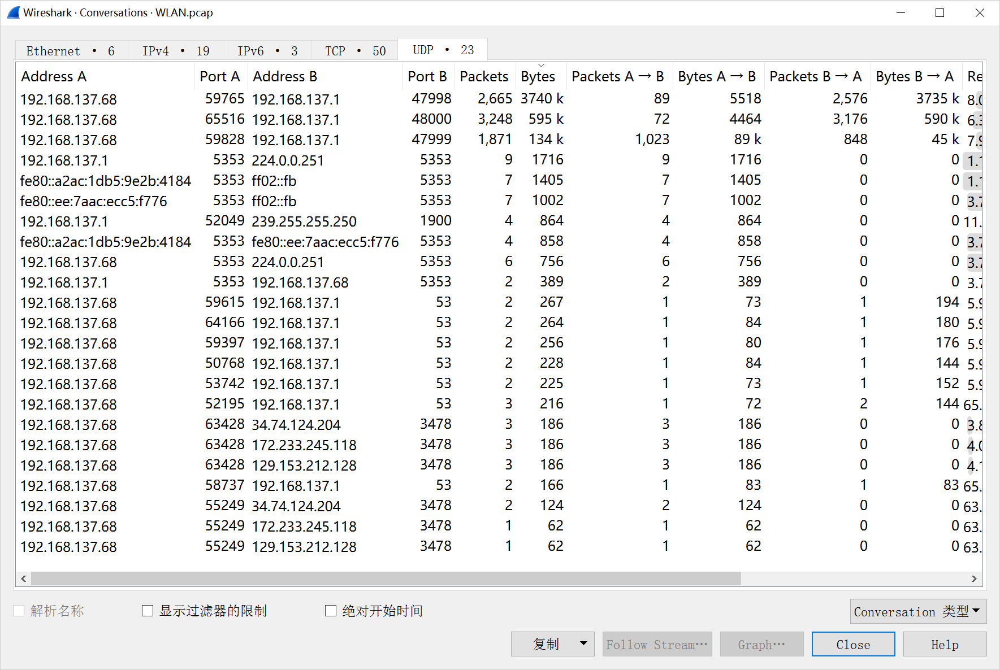

结合日志，端口47998，UDP Stream 16是视频流；端口48000，UDP Stream 14是音频流。我们先把视频流 B->A (B是服务端)的包选中，导出为`udp_stream_16.bin`。

接下来我们处理视频。Sunshine的源码实在是没法看，那就看[客户端Moonlight解析视频流的代码](https://github.com/moonlight-stream/moonlight-common-c/blob/dff1690fe1fe603056ce9b6019f7c52063053f36/src/VideoStream.c#L96)：

```cpp
encrypted = !!(EncryptionFeaturesEnabled & SS_ENC_VIDEO);
decryptedSize = StreamConfig.packetSize + MAX_RTP_HEADER_SIZE;
```

这下我们知道了视频流UDP Payload的大小是`StreamConfig.packetSize + MAX_RTP_HEADER_SIZE`。从日志里可以看出，packetSize是1392，MAX_RTP_HEADER_SIZE是16。

仿照[Moonlight源码](https://github.com/moonlight-stream/moonlight-common-c/blob/dff1690fe1fe603056ce9b6019f7c52063053f36/src/RtspConnection.c#L94)，我们还可以解析一下RTSP的header，确认一下发现是正确的；然后把所有的header删掉，保存为udp_stream_16_trim.bin。

In [23]:
def parse_header(_bin: bytes):
    print(_bin[:20])
    _is_encrypted = (int.from_bytes(_bin[0:2], byteorder='big') & 0x8000) == 0
    _length = int.from_bytes(_bin[1:2], byteorder='big') 
    _sequence_number = int.from_bytes(_bin[2:4], byteorder='big')
    return {
        "is_encrypted": _is_encrypted,
        "length": _length,
        "sequence_number": _sequence_number,
        # "tag": _tag,
        # "data": _data
    }
    
hex_ = '90000147000cbd58000000000000000000238e006b0000008d000800801c40008e00008ea10000000000008eaec3219df100008f000007b5800004ce03d8798cb3c51ba21188d6296a79b3852530c5ec103d9b3df447ba8fdc9e77cf603d8a5a82a81800008f00008f00008f00009f99f7494abc9b78fcc355ceda52008f47000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000'

# convert hex to int
_arr = bytes()
for _c in range(0, len(hex_), 2):
    _arr += bytes([int(hex_[_c:_c+2], 16)])
_arr

parse_header(_arr)

b'\x90\x00\x01G\x00\x0c\xbdX\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x8e\x00'


{'is_encrypted': False, 'length': 0, 'sequence_number': 327}

In [5]:
_payloads = b''

with open("udp_stream_16.bin", "rb") as f:
    _bin = f.read()
    _offset = 0
    while _offset < len(_bin):
        _packet = parse_header(_bin[_offset:_offset + 12])
        print(_packet)
        
        _payloads += _bin[_offset+16: _offset+1408]  # 1392 bytes as shown in logs
        _offset += 1408
        
# pretty print _bin

for i in range(0, len(_payloads),16):
    print(_payloads[i:i+8].hex(), _payloads[i+8:i+16].hex())
    
# save payload to a bin

with open("udp_stream_16_trim.bin", "wb") as f:
    f.write(_payloads)

b'\x90\x00\x00\x00\x00\x02i6\x00\x00\x00\x00'
{'is_encrypted': False, 'length': 0, 'sequence_number': 0}
b'\x90\x00\x00\x01\x00\x02i6\x00\x00\x00\x00'
{'is_encrypted': False, 'length': 0, 'sequence_number': 1}
b'\x90\x00\x00\x02\x00\x02i6\x00\x00\x00\x00'
{'is_encrypted': False, 'length': 0, 'sequence_number': 2}
b'\x90\x00\x00\x03\x00\x02i6\x00\x00\x00\x00'
{'is_encrypted': False, 'length': 0, 'sequence_number': 3}
b'\x90\x00\x00\x04\x00\x02i6\x00\x00\x00\x00'
{'is_encrypted': False, 'length': 0, 'sequence_number': 4}
b'\x90\x00\x00\x05\x00\x02p\xb9\x00\x00\x00\x00'
{'is_encrypted': False, 'length': 0, 'sequence_number': 5}
b'\x90\x00\x00\x06\x00\x02p\xb9\x00\x00\x00\x00'
{'is_encrypted': False, 'length': 0, 'sequence_number': 6}
b'\x90\x00\x00\x07\x00\x02p\xb9\x00\x00\x00\x00'
{'is_encrypted': False, 'length': 0, 'sequence_number': 7}
b'\x90\x00\x00\x08\x00\x02\x99#\x00\x00\x00\x00'
{'is_encrypted': False, 'length': 0, 'sequence_number': 8}
b'\x90\x00\x00\t\x00\x02\x99#\x00\x00\x00\x

接下来该怎么办？确实可以继续看Moonlight的源码，把喂进H264解码器的数据解析出来，然后解码，然后播放。但是这个过程实在太复杂了，我们可以用一个更简单的方法：FFMpeg, 启动！试试H264的容错机制能不能在不处理padding和冗余的情况下找出能看清flag的帧。

In [24]:
!D:\Downloads\BBDown\ffmpeg.exe -err_detect ignore_err -i udp_stream_16_trim.bin output/frame_%04d.png

ffmpeg version 7.0-essentials_build-www.gyan.dev Copyright (c) 2000-2024 the FFmpeg developers
  built with gcc 13.2.0 (Rev5, Built by MSYS2 project)
  configuration: --enable-gpl --enable-version3 --enable-static --disable-w32threads --disable-autodetect --enable-fontconfig --enable-iconv --enable-gnutls --enable-libxml2 --enable-gmp --enable-bzlib --enable-lzma --enable-zlib --enable-libsrt --enable-libssh --enable-libzmq --enable-avisynth --enable-sdl2 --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxvid --enable-libaom --enable-libopenjpeg --enable-libvpx --enable-mediafoundation --enable-libass --enable-libfreetype --enable-libfribidi --enable-libharfbuzz --enable-libvidstab --enable-libvmaf --enable-libzimg --enable-amf --enable-cuda-llvm --enable-cuvid --enable-dxva2 --enable-d3d11va --enable-d3d12va --enable-ffnvcodec --enable-libvpl --enable-nvdec --enable-nvenc --enable-vaapi --enable-libgme --enable-libopenmpt --enable-libopencore-amrwb --enable-libmp3lame --e

真能找出来，成了！

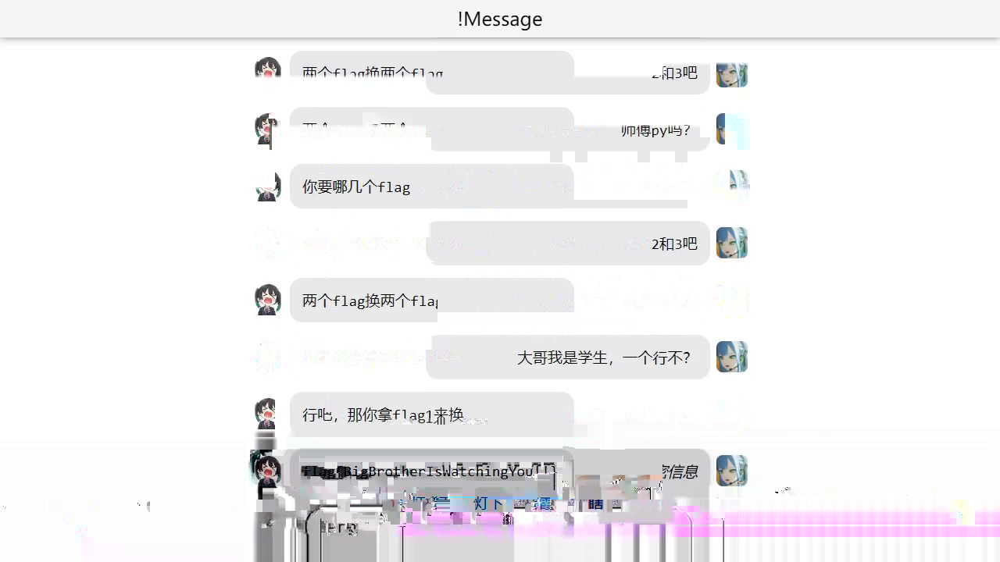

### Flag3

Flag3 需要解析音频数据。在第一阶段提示出来之前，我是毫无头绪的。第一阶段提示给了个无头无尾的解析Opus加密音频流的代码，它要怎么用，输入又是什么？不妨问问GPT：

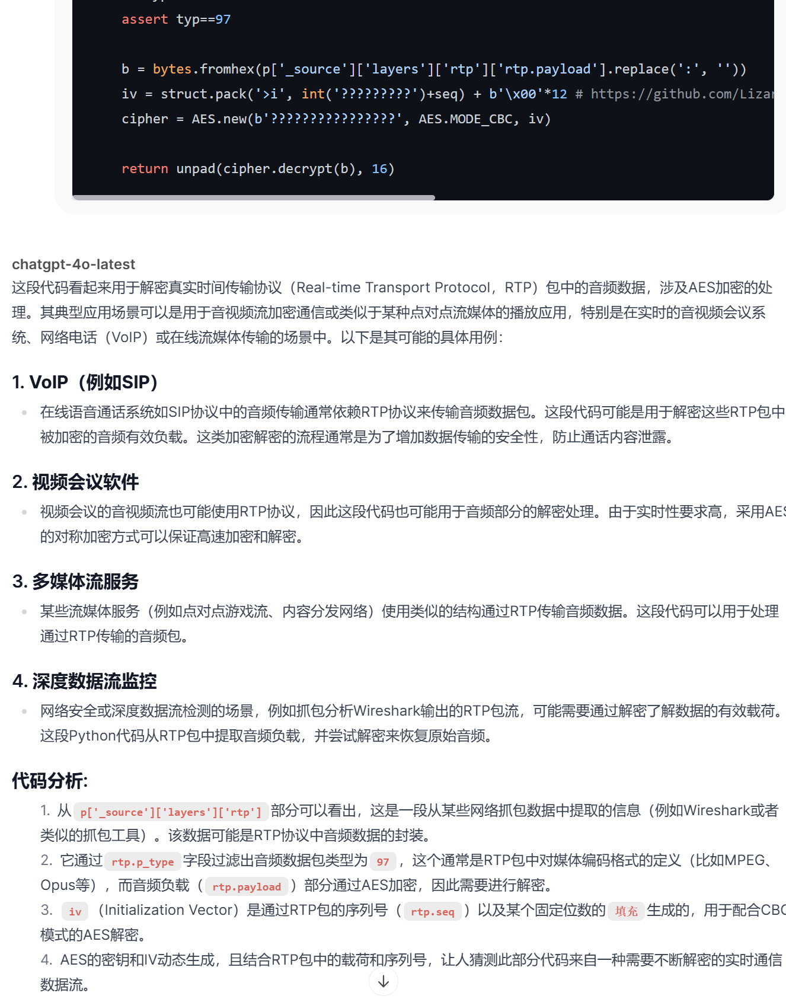

GPT告诉我们它的输入来自Wireshark。那怎么把PCap转换成这个函数输入的形式呢？它看上去像是某种JSON。再问问GPT：

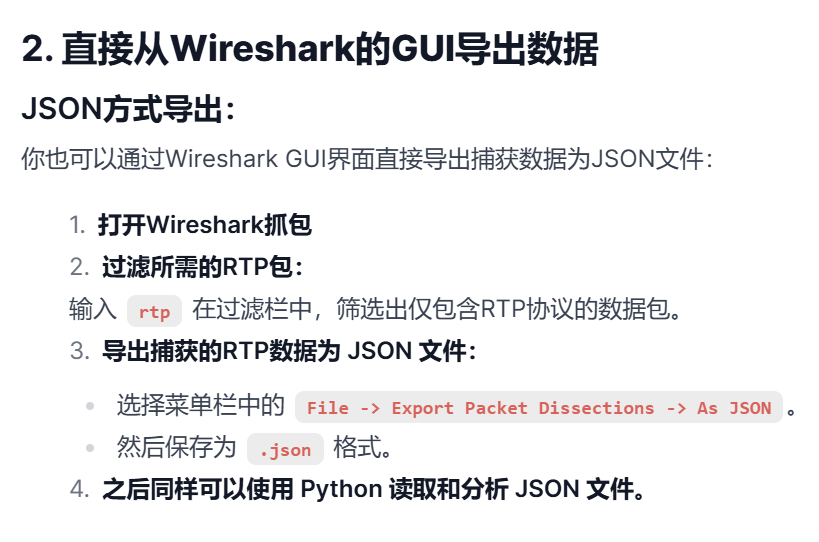

好好好！这就把udp stream 14导出为`wireshark_parsed.json`。
访问[提示代码中给的链接](https://github.com/LizardByte/Sunshine/blob/190ea41b2ea04ff1ddfbe44ea4459424a87c7d39/src/stream.cpp#L1516)，我们能知道提示代码中的问号分别是RIKEY和RIKEYID，这两个日志中都有。
现在就可以提取出原始Opus数据了：

In [6]:
import struct
from Crypto.Cipher import AES
from Crypto.Util.Padding import unpad

RIKEY = 'F3CB8CFA676D563BBEBFC80D3943F10A'

RIKEYID = '1485042510'

def decrypt_audio_pkt(p):
    typ = int(p['_source']['layers']['rtp']['rtp.p_type'])
    seq = int(p['_source']['layers']['rtp']['rtp.seq'])
    if typ==127: return # fec
    assert typ==97
    
    b = bytes.fromhex(p['_source']['layers']['rtp']['rtp.payload'].replace(':', ''))
    iv = struct.pack('>i', int(RIKEYID)+seq) + b'\x00'*12 # https://github.com/LizardByte/Sunshine/blob/190ea41b2ea04ff1ddfbe44ea4459424a87c7d39/src/stream.cpp#L1516
    cipher = AES.new(bytes.fromhex(RIKEY), AES.MODE_CBC, iv)
    
    return unpad(cipher.decrypt(b), 16)

In [7]:
import json
with open("wireshark_parsed.json", "r") as f:
    _packets = json.load(f)
    
_filtered = [p for p in _packets if "rtp.p_type" in p['_source']['layers']['rtp'] and p['_source']['layers']['rtp']['rtp.p_type'] == '97']

len(_filtered), _filtered[0]

(2118,
 {'_index': 'packets-2024-09-30',
  '_type': 'doc',
  '_score': None,
  '_source': {'layers': {'frame': {'frame.encap_type': '1',
     'frame.time': 'Sep 30, 2024 17:14:29.727986000 中国标准时间',
     'frame.offset_shift': '0.000000000',
     'frame.time_epoch': '1727687669.727986000',
     'frame.time_delta': '0.005194000',
     'frame.time_delta_displayed': '0.344671000',
     'frame.time_relative': '9.970745000',
     'frame.number': '712',
     'frame.len': '182',
     'frame.cap_len': '182',
     'frame.marked': '0',
     'frame.ignored': '0',
     'frame.protocols': 'eth:ethertype:ip:udp:rtp',
     'frame.coloring_rule.name': 'UDP',
     'frame.coloring_rule.string': 'udp'},
    'eth': {'eth.dst': '3e:35:e8:95:50:fc',
     'eth.dst_tree': {'eth.dst_resolved': '3e:35:e8:95:50:fc',
      'eth.dst.oui': '4077032',
      'eth.addr': '3e:35:e8:95:50:fc',
      'eth.addr_resolved': '3e:35:e8:95:50:fc',
      'eth.addr.oui': '4077032',
      'eth.dst.lg': '1',
      'eth.lg': '1',
   

好消息是，[PyOGG](https://pyogg.readthedocs.io)声称它可以直接解码Opus数据流，[文档](https://pyogg.readthedocs.io/en/latest/examples.html#encode-and-decode-opus-packets)里还给出了把数据流导出成Wave文件的例子。我们可以试试看。

试试就逝世：
```
cannot import name 'OpusDecoder' from 'pyogg'
```

哦，原来是只有从源码安装才能享受到这个功能。那就从源码安装：

```
TypeError: underlying buffer is not writable
```

蛤？这是什么情况？看了一下源码，发现它在把数据流转换成ctypes array的时候，传了一个只读的Buffer。我们给它加个Patch：

```python
# pyogg/opusdecoder.py, line 87, in decode

# Create a ctypes array from the memoryview (without copying
# data)
Buffer = ctypes.c_char * len(encoded_bytes)
# If encoded_bytes is immutable (like a bytes object), convert it to bytearray
writable_bytes = bytearray(encoded_bytes)
encoded_bytes_ctypes = Buffer.from_buffer(writable_bytes)
```

现在终于能work了！仿照文档里的示例，现在可以把Opus数据流转换成Wave：

In [9]:
import wave
from pyogg import OpusDecoder

# Setup decoding
# ==============

# Create an Opus decoder
opus_decoder = OpusDecoder()
opus_decoder.set_channels(2)
opus_decoder.set_sampling_frequency(48000)

# Open an output wav for the decoded PCM
output_filename = "output.wav"
wave_write = wave.open(output_filename, "wb")
print("Writing wav into file '{:s}'".format(output_filename))

# Save the wav's specification
wave_write.setnchannels(2)
wave_write.setframerate(24000)
wave_write.setsampwidth(4)

# Execute encode-decode
# =====================

# Loop through the wav file's PCM data and encode it as Opus

for p in _filtered:
    _decoded = decrypt_audio_pkt(p)
    decoded_pcm = opus_decoder.decode(_decoded)
    # Save the decoded PCM as a new wav file
    wave_write.writeframes(decoded_pcm)

wave_write.close()
print("Finished.")

Writing wav into file 'output.wav'
Finished.


在Audition里打开输出的Wave文件，这波形看着有点意思。前面是苹果电脑开机的“Dong”声，后面是一段使用某种方法编码的Flag。

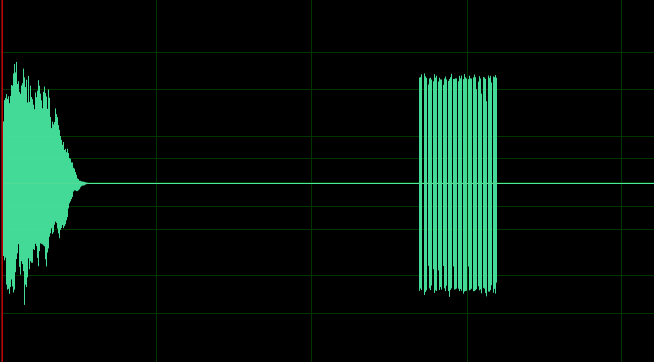

第一阶段提示告诉我们Flag是数字。什么东西能把数字编码成波形呢？经常打电话的朋友应该不难发现，答案是DTMF，i.e. 电话按键音。
找一个[Python写的DTMF解码器](https://github.com/hfeeki/dtmf/blob/master/dtmf-decoder.py)， 把裁剪后的wav文件喂进去，得到Flag。

In [31]:
!python3 dtmf.py codes3.wav

225628252823


d:\Downloads\geekgame24\misc-sunshine\dtmf.py:26: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fps, data = wavfile.read(file)
